# Assigment 5

Welcome to the last ML assignment in which you will experiment (and hopefully get some experience) with a technique called Principal Component Analysis (PCA). This method is often used in Machine Learning for "dimensionality reduction", that is for reducing the dimensionality of the data. Put in other words, it is used to "compress" the data without (hopefully) lossing too much information. PCA can also be used for compressing images, during exploratory data analysis (when we try to "get a sense of the data") or as a visualization technique (when we try to "see what our data looks like").

We can also view PCA as an unsupervised learning algorithm that learns a representation of data. This learned representation is based on two criteria. First, PCA learns a representation that has lower dimensionality than the original data. Second, elements in this representation have no linear correlations with each other.

PCA learns orhogonal linear transformation of the data. This transformation tries to learn the best projection that keeps as much information about the data as possible, meassured by least-squared reconstruction error. Let us start with some neccessary imports, as we usually do.

**Note**: Due to time constraints, this assignment will _"scratch the surface"_  when it comes to deriving the actual process of obtaining the principal components. If you would like a more in-depth guide, we strongly recommend [this tutorial](https://web.archive.org/web/20181020043046/https://tkv.io/posts/tutorial-on-pca/). It also truns out the best images that illustrate this idea can be found on a Vietnamese (!) blog, such as the description of the [PCA procedure](https://web.archive.org/web/20220616235646im_/https://machinelearningcoban.com/assets/27_pca/pca_procedure.png) as well as the large [PCA idea](https://web.archive.org/web/20220616235849im_/https://machinelearningcoban.com/assets/27_pca/pca_idea.png) -- feel free to take a look!

In [1]:
!wget https://github.com/NaiveNeuron/ml_exercises/raw/master/assignment5/data.csv

--2023-11-29 14:55:14--  https://github.com/NaiveNeuron/ml_exercises/raw/master/assignment5/data.csv
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/NaiveNeuron/ml_exercises/master/assignment5/data.csv [following]
--2023-11-29 14:55:14--  https://raw.githubusercontent.com/NaiveNeuron/ml_exercises/master/assignment5/data.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 222731 (218K) [text/plain]
Saving to: ‘data.csv.2’

data.csv.2          100%[===================>] 217.51K  --.-KB/s    in 0.03s   

2023-11-29 14:55:14 (8.46 MB/s) - ‘data.csv.2’ saved [222731/222731]



In [15]:
import numpy as np
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.datasets import fetch_olivetti_faces
import matplotlib.animation as animation
from matplotlib import rc

def plot_faces(images, n_col=3, n_row=2):
    plt.figure(figsize=(2. * n_col, 2.26 * n_row))
    for i, comp in enumerate(images):
        plt.subplot(n_row, n_col, i + 1)
        vmax = max(comp.max(), -comp.min())
        plt.imshow(comp.reshape((64, 64)), cmap=plt.cm.gray,
                   interpolation='nearest',
                   vmin=-vmax, vmax=vmax)
        plt.xticks(())
        plt.yticks(())


### Small example of PCA from the ground up

In this first example we will work with two dimensional data so we can easily visualize the results. Here we prepared some highly correlated data (correlation coefficient at *0.9* -- you can play around with this [[literally, even in multiplayer mode](http://guessthecorrelation.com/)]).

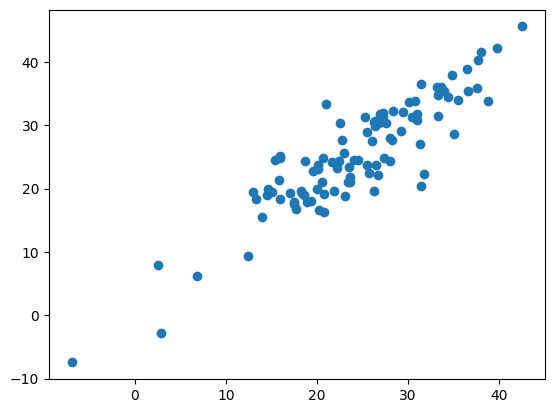

In [3]:
xx = np.array([-0.51, 51.2])
yy = np.array([0.33, 51.6])
means = [xx.mean(), yy.mean()]
stds = [xx.std() / 3, yy.std() / 3]
corr = 0.9 # correlation
covs = [[stds[0]**2, stds[0]*stds[1]*corr],
        [stds[0]*stds[1]*corr, stds[1]**2]]

X = np.random.multivariate_normal(means, covs, 100)
plt.scatter(X[:, 0], X[:, 1])
plt.show()

PCA is very sensitive to scale of the features. For PCA to work properly (that is in order for it to give us the results we described above) you *have to* subtract the mean from the data so every feature has **zero mean**.

Otherwise we risk that the first principal component may just resemble the mean.

In [4]:
# Perform feature scaling here

mean = np.mean(X, axis=0)
std = np.std(X, axis=0)

X = (X-mean) / std

Since PCA should project our data to the space where elements have no linear correlations, we can start by examining this relationship between the dimensons in our original data. We can get the unbiased sample covariance matrix associated with X by computing $$\Sigma = \frac{1}{n-1}X^{T}X$$ or by using numpy's `np.cov` function.

*(Note that by default `np.cov` expects each row of the input to represent a variable, and each column a single observation of all those variables. In our case that means either transposing the input data via `X.T` or setting the `rowvar` parameter. More info [in the docs](https://docs.scipy.org/doc/numpy/reference/generated/numpy.cov.html)).*

*(Second note $\Sigma = \frac{1}{n}X^{T}X$ is population covariance which is biased)*

In [5]:
# Compute and store covariance matrix here.
sigma = np.cov(X.T)

*Please, briefly describe here what can we say about our data sample from the computed covariance matrix.*

Now, it is time to compute eigenvalues and eigenvectors of our data. As it turns out, these eigenvectors correspond to the principal components of our data. We can learn an n-dimensional representation that provides the best reconstruction of the original data (in the sense of mean squared error) and that this representation actually corresponds to the first n principal component of the data and therefore to our computed eigenvectors. Thus we can use PCA as a simple and eﬀective dimensionality reduction method that preserves as much of the information in the data as possible (again, as measured by least-squares reconstruction error).

Since our matrix $\Sigma$ is positive semi-definite, we can always find eigenvectors.

Probably the easiest way of doing so is by using `numpy`'s `np.linalg.eigh` function which returns two matricies $W$ and $V$. Matrix $W$ contains eigenvalues (in sorted order) and matrix $V$ contains eigenvectors.

For PCA to work, these vectors have to be of unit length. Luckily most libraries already takes care of normalizing these vectors. In the next cell, please use this function to extract eigenvectors with the coresponding eigenvalues.

In [6]:
W, V = np.linalg.eigh(sigma)

As the last step of PCA we have to transform our original data using the learned transformation.

We now have all principal components of our data. If we want to transform our data to $k$ dimensions, we can extract $k$ (in our toy 2-dimensional case just one) of these components (eigenvectors) and construct a matrix $U_k$ of $n \times k$ dimensions. This will be our linear transformation matrix. With this matrix we transform our original data $X$ of shape $ n \times m$, where $n$ is the number of examples and $m$ is the number of original features, by simply performing $$X_{transformed} = X \cdot U_k^{T}$$

In [7]:
# Extract and transform over here.
X_new = np.matmul(X, V[np.where(W == max(W))[0][0]])

Now we can use a "stock" PCA implementation from `sklearn` library to compare our vectors. The difference between the two transformed vectors should be very small.

In [8]:
pca = PCA(n_components=1)
X_tranformed = pca.fit_transform(X)
print("Diff: {}".format(np.sum(X_new - X_tranformed)))

Diff: -6.480149750132114e-12


### PCA and explained variance

For our second example we loaded a 20 dimensional data sample.

PCA can also be viewed as a transformation that tries to keep as much variance in the data as possible while lowering its dimension. This is due to the fact that we are keeping the $k$ largest principal components. The first principal component tries to account for as much of the variability of the data as possible. The second one tries to account for as much of the remaining variability, and so on. By keeping the $k$ largest principal components we try to keep as much variance as possible (within those $k$ dimensions).

We can also see how much variance each dimension retains. The fitted `PCA` object contains variables `explained_variance_ ` and `explained_variance_ratio_ `, which can help us answer this question. This is often used to help us decide how many principal components we will keep to retain as much variance as possible.

In the next cell please fit the PCA on provided data. What can we say about our data and its variance? How many components do we need to retain 99% of variance?

In [9]:
data = np.loadtxt('data.csv', delimiter=',')

In [10]:
for i in range(1, 21):
  pca = PCA(n_components=i)
  pca.fit_transform(data)
  print("k: {}  explained variance: {}%".format(i, round(np.sum(pca.explained_variance_ratio_)*100, 2)))

k: 1  explained variance: 28.09%
k: 2  explained variance: 46.27%
k: 3  explained variance: 62.27%
k: 4  explained variance: 76.31%
k: 5  explained variance: 85.98%
k: 6  explained variance: 91.87%
k: 7  explained variance: 96.52%
k: 8  explained variance: 98.28%
k: 9  explained variance: 99.92%
k: 10  explained variance: 100.0%
k: 11  explained variance: 100.0%
k: 12  explained variance: 100.0%
k: 13  explained variance: 100.0%
k: 14  explained variance: 100.0%
k: 15  explained variance: 100.0%
k: 16  explained variance: 100.0%
k: 17  explained variance: 100.0%
k: 18  explained variance: 100.0%
k: 19  explained variance: 100.0%
k: 20  explained variance: 100.0%


One way is to take a look at some sum of vector "explained_variance_ratio_" provided by sklearn, this sum tells as percentage of variance that is explainable by those k dimensions. In this case we can see that to explain 99% of variance we need 9 dimenstion and 10 dimensions explain whole variance

In [11]:
sigma_2 = np.cov(data.T)
eigVals, _ = np.linalg.eigh(sigma_2)

total_s = np.sum(eigVals)
temp_s = 0
for i, val in enumerate(np.sort(eigVals)[::-1]):
  temp_s += val
  print("k: {}  explained variance: {}%".format(i+1, round(temp_s/total_s*100, 2)))

k: 1  explained variance: 28.09%
k: 2  explained variance: 46.27%
k: 3  explained variance: 62.27%
k: 4  explained variance: 76.31%
k: 5  explained variance: 85.98%
k: 6  explained variance: 91.87%
k: 7  explained variance: 96.52%
k: 8  explained variance: 98.28%
k: 9  explained variance: 99.92%
k: 10  explained variance: 100.0%
k: 11  explained variance: 100.0%
k: 12  explained variance: 100.0%
k: 13  explained variance: 100.0%
k: 14  explained variance: 100.0%
k: 15  explained variance: 100.0%
k: 16  explained variance: 100.0%
k: 17  explained variance: 100.0%
k: 18  explained variance: 100.0%
k: 19  explained variance: 100.0%
k: 20  explained variance: 100.0%


Other way is to compute fraction of eigenvalues corresponding to used iegenvectors and total sum of eigenvalues, because eigenvalues tells us about variance in direction of it's eigenvector. Here we see that we get same numbers so also we need 9 dimensions to explain 99% of variance.


As we can see from the results, some of the dimensions have almost no added information value. This means that if we wanted to use this data in a classification or prediction setup, we can just as well only use half of our features. This will make our data smaller and therefore speed up our training and may also improve our prediction results since our models do not have to learn to 'ignore' these features.

### Playing with EigenFaces

One of the most famous uses of PCA is called **eigenfaces**. The Eigenface approach began with a search for a low-dimensional representation of face images. Principal component analysis could be used on a collection of face images to provide a set of basis features. These basis images (also known  as Eigenpictures) could be linearly combined to reconstruct images in the original training set.

Informaly, human face can be thought of as set of 'standardized features' that can be extracted from large set of faces by statistical analysis. Each face is a linear combination of these basic features (somewhat standardized faces). It can contain 10% of eigenface 1, 3% of eigenface 2 and so on...

To generate eigenfaces we loaded a standard face dataset which consists out of 400 faces. Each image is of size $64 \times 64$. To calculate PCA you first need to normalize each face. You sould compute average image and subtract it from each face.

Calculate the eigenvectors and eigenvalues. Each eigenvector has the same dimensionality (number of components) as the original image, and thus can seen as an image in and of itself. The eigenvectors are therefore called `eigenfaces`. They are the directions in which the images differ from the mean image.

In the next cell please normalize the loaded images of faces and compute the eigenfaces using sklearn's PCA method. You can use the provided `plot_faces(images, n_cols, n_rows)` function, where the first argument is a list of images of faces of length `n_cols * n_rows`. Values `n_cols` and `n_rows` are used to draw subplots, so if we want to visualize $k=6$ eigenfaces we would set something like `n_cols=3` and `n_rows=2`.

Dataset consists of 400 faces and 4096 features


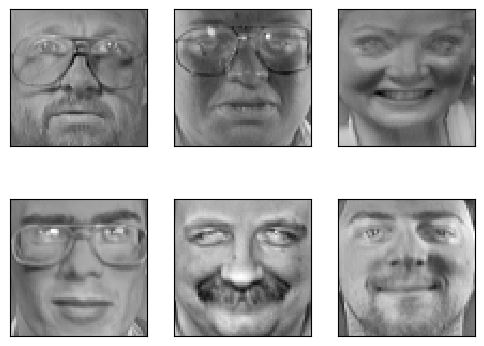

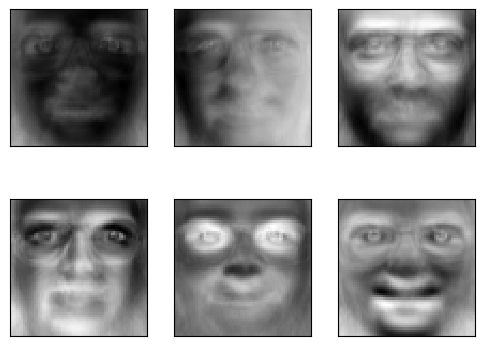

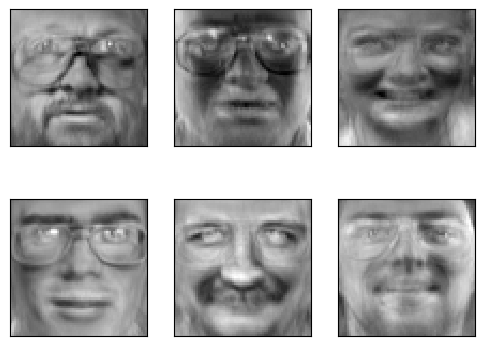

In [21]:
# Load faces data
dataset = fetch_olivetti_faces(shuffle=True)
faces = dataset.data

n_rows, n_cols = 2, 3
n_components = n_rows * n_cols
n_samples, n_features = faces.shape

print("Dataset consists of {} faces and {} features".format(n_samples, n_features))

# normalize faces data
faces = (faces - np.mean(faces, axis=0)) / np.std(faces, axis=0)

# plot sample data
plot_faces(faces[:n_components], n_cols, n_rows)
plt.show()

# fit the PCA
pca_ = PCA(n_components=6)
faces_pca = pca_.fit_transform(faces)

# show standardize faces
plot_faces(pca_.components_[:n_components], n_cols, n_rows)
plt.show()

plot_faces(pca_.inverse_transform(faces_pca)[:n_components], n_cols, n_rows)
plt.show()

# The final exercise

`sklearn`'s PCA objects also contain a function `inverse_transform()` which can transform the data back to its original space. As you can imagine, this can be used to reconstruct the face back to its original form. So for example, we can take a face, transform it to our $k$ eigenface space, change some of its values and transform it back to obtain a new face, or just try to reconstruct back the original face with $k$ principal components.

As a final exercise, create an `pyplot` animation where in the $k$th-step of animation you will reconstruct original image with first $k$ principal components. We believe that [this matplotlib example](https://matplotlib.org/stable/gallery/animation/dynamic_image.html) may be of some help with regards to the animation.

Alternatively (and possibly for even more bonus points), you can create a very nice interactive demo from within these Jupyter/Google Colab notebooks -- for instance by having a slider that would determine the value of $k$ and interactively update the output image. You can more info and some more inspiration [here](https://colab.research.google.com/notebooks/forms.ipynb).

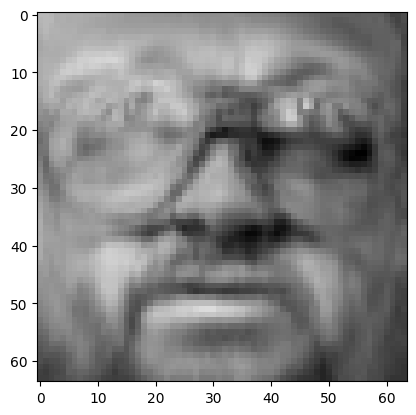

In [26]:
rc('animation', html='jshtml')
fig, ax = plt.subplots()


def f(x, y):
    return np.sin(x) + np.cos(y)

x = np.linspace(0, 2 * np.pi, 120)
y = np.linspace(0, 2 * np.pi, 100).reshape(-1, 1)

# ims is a list of lists, each row is a list of artists to draw in the
# current frame; here we are just animating one artist, the image, in
# each frame
ims = []
for i in range(1,50):
    pca_ = PCA(n_components=i)
    faces_pca = pca_.fit_transform(faces)
    comp = pca_.inverse_transform(faces_pca)[0]
    vmax = max(comp.max(), -comp.min())
    im = ax.imshow(comp.reshape((64, 64)), cmap=plt.cm.gray,
               interpolation='nearest',
               vmin=-vmax, vmax=vmax, animated=True)
    if i == 1:
        ax.imshow(comp.reshape((64, 64)), cmap=plt.cm.gray,
               interpolation='nearest',
               vmin=-vmax, vmax=vmax, animated=True)
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True,
                                repeat_delay=1000)


ani
#plt.show()

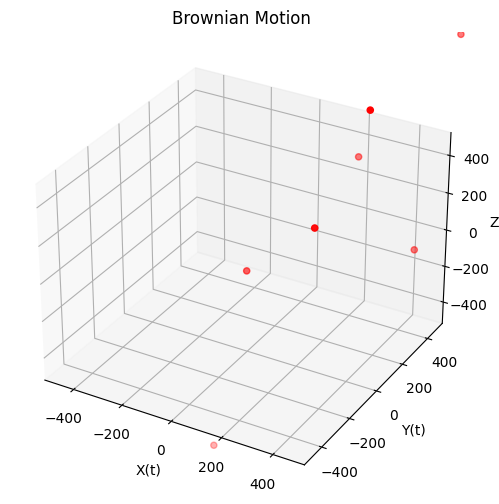

In [14]:
# Other Brownian Motion
from math import *
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation

fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection='3d')

N=10
#val1 = 500

x=500*np.random.random(N)
y=500*np.random.random(N)

z=500*np.random.random(N)

def frame(w):
    ax.clear()

    global x,y,z
    x=x+np.random.normal(loc=0.0,scale=50.0,size=10)
    y=y+np.random.normal(loc=0.0,scale=50.0,size=10)
    z=z+np.random.normal(loc=0.0,scale=50.0,size=10)


    plt.title("Brownian Motion")
    ax.set_xlabel('X(t)')
    ax.set_xlim3d(-500.0,500.0)
    ax.set_ylabel('Y(t)')
    ax.set_ylim3d(-500.0,500.0)
    ax.set_zlabel('Z(t)')


    ax.set_zlim3d(-500.0,500.0)

    plot=ax.scatter3D(x, y, z, c='r')


    return plot

from matplotlib import rc
rc('animation', html='jshtml')

anim = animation.FuncAnimation(fig, frame, frames=100, blit=False, repeat=True)

anim